# PREDICTION OF TERM DEPOSIT SUBSCRIPTION FOR BANK MARKETING DATA

In [173]:
## Libraries importing
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
from scipy import stats
# # Ignore Warning
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import PowerTransformer
from scipy.stats import shapiro
from scipy.stats import chi2_contingency

## Objectives:
* 1.To identify the key factors influencing customers to subscribe to term deposits through the marketing campaign.
* 2.To analyze the impact of customer demographics like age, marital status, education level on the likelihood to purchase         term deposits.
* 3.To perform hypothesis testing and statistical inference to gain detailed insight on which attributes have significant         influence on customer response.
* 4.To develop a predictive model to classify which customers are more likely to subscribe to subscribe  to term deposit based        on customer attributes and campaign details. 

# Data Description

In [174]:
## Importing data 
data = pd.read_csv("C:/Users/lohithlikith/Documents/Datasets/Bank marketing data/bank_data (1).csv")
data

,Age,Job,Marital Status,Education,Default,Balance,Housing Loan,Personal Loan,Contact,Day,Month,Duration,Campaign,Pdays,Previous,Poutcome,Term Deposit
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,33,services,married,secondary,no,-333,yes,no,cellular,30,jul,329,5,-1,0,unknown,no
4517,57,self-employed,married,tertiary,yes,-3313,yes,yes,unknown,9,may,153,1,-1,0,unknown,no
4518,57,technician,married,secondary,no,295,no,no,cellular,19,aug,151,11,-1,0,unknown,no
4519,28,blue-collar,married,secondary,no,1137,no,no,cellular,6,feb,129,4,211,3,other,no


In [175]:
## size of the data
data.size

76857

In [176]:
## shape of the data
data.shape

(4521, 17)

(4521, 17)

In [177]:
## To show first five rows of the data
data.head()

,Age,Job,Marital Status,Education,Default,Balance,Housing Loan,Personal Loan,Contact,Day,Month,Duration,Campaign,Pdays,Previous,Poutcome,Term Deposit
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no


In [178]:
## To show last five rows of the data
data.tail()

,Age,Job,Marital Status,Education,Default,Balance,Housing Loan,Personal Loan,Contact,Day,Month,Duration,Campaign,Pdays,Previous,Poutcome,Term Deposit
4516,33,services,married,secondary,no,-333,yes,no,cellular,30,jul,329,5,-1,0,unknown,no
4517,57,self-employed,married,tertiary,yes,-3313,yes,yes,unknown,9,may,153,1,-1,0,unknown,no
4518,57,technician,married,secondary,no,295,no,no,cellular,19,aug,151,11,-1,0,unknown,no
4519,28,blue-collar,married,secondary,no,1137,no,no,cellular,6,feb,129,4,211,3,other,no
4520,44,entrepreneur,single,tertiary,no,1136,yes,yes,cellular,3,apr,345,2,249,7,other,no


In [179]:
## To get all collumn names present in the data
column_names = data.columns.tolist()
print(column_names)

['Age', 'Job', 'Marital Status', 'Education', 'Default', 'Balance', 'Housing Loan', 'Personal Loan', 'Contact', 'Day', 'Month', 'Duration', 'Campaign', 'Pdays', 'Previous', 'Poutcome', 'Term Deposit']


In [180]:
## For replacing " " (space) by using "_"(underscore) 
data.columns = [col.replace(" ", "_") for col in data.columns]
print(data.columns)

Index(['Age', 'Job', 'Marital_Status', 'Education', 'Default', 'Balance',
       'Housing_Loan', 'Personal_Loan', 'Contact', 'Day', 'Month', 'Duration',
       'Campaign', 'Pdays', 'Previous', 'Poutcome', 'Term_Deposit'],
      dtype='object')


In [181]:
## discriptive statistics of numerical data
data.describe()

,Age,Balance,Day,Duration,Campaign,Pdays,Previous
count,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000
mean,41.170095,1422.657819,15.915284,263.961292,2.793630,39.766645,0.542579
std,10.576211,3009.638142,8.247667,259.856633,3.109807,100.121124,1.693562
min,19.000000,-3313.000000,1.000000,4.000000,1.000000,-1.000000,0.000000
25%,33.000000,69.000000,9.000000,104.000000,1.000000,-1.000000,0.000000
50%,39.000000,444.000000,16.000000,185.000000,2.000000,-1.000000,0.000000
75%,49.000000,1480.000000,21.000000,329.000000,3.000000,-1.000000,0.000000
max,87.000000,71188.000000,31.000000,3025.000000,50.000000,871.000000,25.000000


In [182]:
## Data Types 
data.dtypes

Age                int64
Job               object
Marital_Status    object
Education         object
Default           object
Balance            int64
Housing_Loan      object
Personal_Loan     object
Contact           object
Day                int64
Month             object
Duration           int64
Campaign           int64
Pdays              int64
Previous           int64
Poutcome          object
Term_Deposit      object
dtype: object

In [183]:
## Gives Information about the data 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4521 entries, 0 to 4520
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             4521 non-null   int64 
 1   Job             4521 non-null   object
 2   Marital_Status  4521 non-null   object
 3   Education       4521 non-null   object
 4   Default         4521 non-null   object
 5   Balance         4521 non-null   int64 
 6   Housing_Loan    4521 non-null   object
 7   Personal_Loan   4521 non-null   object
 8   Contact         4521 non-null   object
 9   Day             4521 non-null   int64 
 10  Month           4521 non-null   object
 11  Duration        4521 non-null   int64 
 12  Campaign        4521 non-null   int64 
 13  Pdays           4521 non-null   int64 
 14  Previous        4521 non-null   int64 
 15  Poutcome        4521 non-null   object
 16  Term_Deposit    4521 non-null   object
dtypes: int64(7), object(10)
memory usage: 600.6+ KB


In [184]:
# To separate the catogorical and numerical collumns
object_column_names = data.dtypes[data.dtypes.values == 'object'].index.tolist()
df_1 = print(object_column_names)
numerical_column_names = data.dtypes[data.dtypes.values != 'object'].index.tolist()
numerical_column_names

['Job', 'Marital_Status', 'Education', 'Default', 'Housing_Loan', 'Personal_Loan', 'Contact', 'Month', 'Poutcome', 'Term_Deposit']


['Age', 'Balance', 'Day', 'Duration', 'Campaign', 'Pdays', 'Previous']

In [185]:
numerical = data[numerical_column_names]
numerical

,Age,Balance,Day,Duration,Campaign,Pdays,Previous
0,30,1787,19,79,1,-1,0
1,33,4789,11,220,1,339,4
2,35,1350,16,185,1,330,1
3,30,1476,3,199,4,-1,0
4,59,0,5,226,1,-1,0
...,...,...,...,...,...,...,...
4516,33,-333,30,329,5,-1,0
4517,57,-3313,9,153,1,-1,0
4518,57,295,19,151,11,-1,0
4519,28,1137,6,129,4,211,3


In [186]:
## Describe 
data[numerical_column_names].describe()

,Age,Balance,Day,Duration,Campaign,Pdays,Previous
count,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000
mean,41.170095,1422.657819,15.915284,263.961292,2.793630,39.766645,0.542579
std,10.576211,3009.638142,8.247667,259.856633,3.109807,100.121124,1.693562
min,19.000000,-3313.000000,1.000000,4.000000,1.000000,-1.000000,0.000000
25%,33.000000,69.000000,9.000000,104.000000,1.000000,-1.000000,0.000000
50%,39.000000,444.000000,16.000000,185.000000,2.000000,-1.000000,0.000000
75%,49.000000,1480.000000,21.000000,329.000000,3.000000,-1.000000,0.000000
max,87.000000,71188.000000,31.000000,3025.000000,50.000000,871.000000,25.000000


## Checking for any null values are present in the data

In [187]:
data.isnull().sum()

Age               0
Job               0
Marital_Status    0
Education         0
Default           0
Balance           0
Housing_Loan      0
Personal_Loan     0
Contact           0
Day               0
Month             0
Duration          0
Campaign          0
Pdays             0
Previous          0
Poutcome          0
Term_Deposit      0
dtype: int64

In [188]:
pd.DataFrame(object_column_names)
new_data = pd.DataFrame(data[['Job', 'Marital_Status', 'Education', 'Default', 'Housing_Loan', 'Personal_Loan', 'Contact', 'Month', 'Poutcome', 'Term_Deposit']])
new_data

,Job,Marital_Status,Education,Default,Housing_Loan,Personal_Loan,Contact,Month,Poutcome,Term_Deposit
0,unemployed,married,primary,no,no,no,cellular,oct,unknown,no
1,services,married,secondary,no,yes,yes,cellular,may,failure,no
2,management,single,tertiary,no,yes,no,cellular,apr,failure,no
3,management,married,tertiary,no,yes,yes,unknown,jun,unknown,no
4,blue-collar,married,secondary,no,yes,no,unknown,may,unknown,no
...,...,...,...,...,...,...,...,...,...,...
4516,services,married,secondary,no,yes,no,cellular,jul,unknown,no
4517,self-employed,married,tertiary,yes,yes,yes,unknown,may,unknown,no
4518,technician,married,secondary,no,no,no,cellular,aug,unknown,no
4519,blue-collar,married,secondary,no,no,no,cellular,feb,other,no


In [189]:
## Value-counts of each variable.
for i in object_column_names:
    print(i + ' :')
    print(data[i].value_counts())
    print('--------------------------------------------------------')

Job :
management       969
blue-collar      946
technician       768
admin.           478
services         417
retired          230
self-employed    183
entrepreneur     168
unemployed       128
housemaid        112
student           84
unknown           38
Name: Job, dtype: int64
--------------------------------------------------------
Marital_Status :
married     2797
single      1196
divorced     528
Name: Marital_Status, dtype: int64
--------------------------------------------------------
Education :
secondary    2306
tertiary     1350
primary       678
unknown       187
Name: Education, dtype: int64
--------------------------------------------------------
Default :
no     4445
yes      76
Name: Default, dtype: int64
--------------------------------------------------------
Housing_Loan :
yes    2559
no     1962
Name: Housing_Loan, dtype: int64
--------------------------------------------------------
Personal_Loan :
no     3830
yes     691
Name: Personal_Loan, dtype: int64
--------

## Data Visualization

In [190]:
import matplotlib.pyplot as plt
import seaborn as sns

In [191]:
#sns.boxplot(df.Age)
#plt.show()

## for interactive box plots
fig = px.box(data, y="Age")
fig.show()


#### Interpretation :
The interactive boxplot provides information about the median, spread, and presence of outliers in the age distribution, 
#making it a useful tool for understanding the characteristics of the data.

In [192]:
#sns.histplot(df.Age, bins=[10,20,30,40,50,60,70,80,90])
#plt.show()

## for interactive histplots
fig = px.histogram(data, x="Age")
fig.show() 

#### Interpretation:
The histogram shows the value counts of indiviuals present in the particular age group


In [193]:
cat_cols = ['Job', 'Marital_Status', 'Education', 'Default', 'Housing_Loan', 'Personal_Loan', 'Contact', 'Month', 'Poutcome','Term_Deposit']

for col1 in cat_cols:
    for col2 in cat_cols:
        fig = px.histogram(data, x=col1, color=col2)
        fig.update_layout(title=f'{col1} vs {col2}')
        fig.update_traces(hovertemplate=col1 +': %{x}<br>'+ 
                           col2 + ': %{data[1]}<br>Count: %{y}')
        fig.show()
        
        
 

#### Interpretation:
The above histograms and bar graphs are visualize the pairwise relationships between the all  categorical variables in the data.

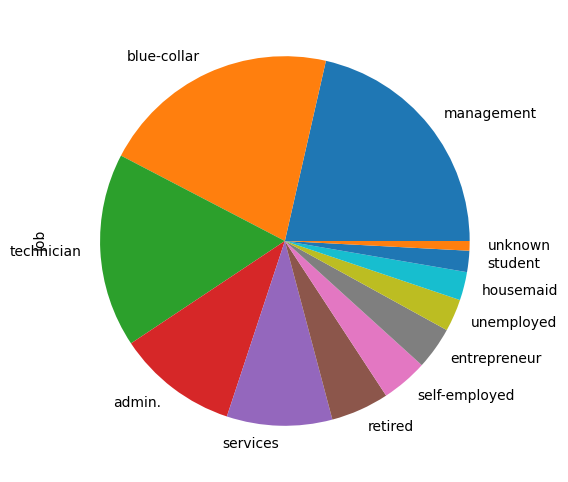

In [194]:
plt.figure(figsize = (6,6))
data['Job'].value_counts().plot(kind = 'pie')
plt.show()

#### Interpretation:
It provides the percentage of different work types for each individual.

In [195]:
# Create a pie plot
fig = px.sunburst(data, path=['Job','Marital_Status','Term_Deposit'], 
                  title='Pie Chart for Term Deposit Subscription')
fig.show()


#### Interpretation:
According to an individual's employment type and marital status, the interactive pie chart displays how many people have a term deposit subscription for that particular combination.
 

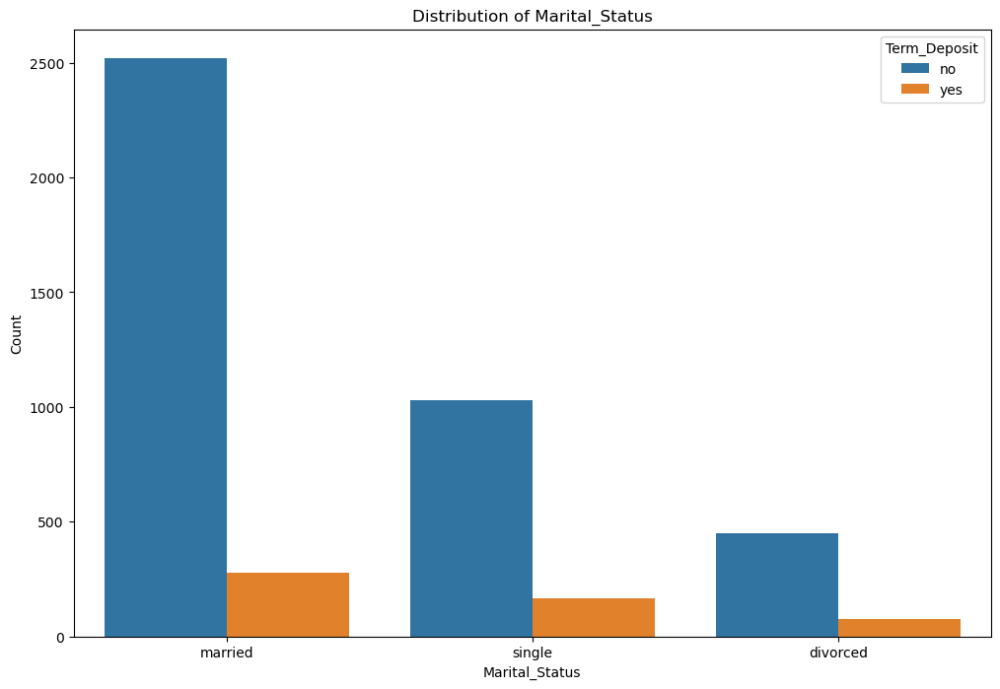

In [196]:
plt.figure(figsize=(12, 8))
sns.countplot(x='Marital_Status', data=data, hue='Term_Deposit')
plt.title('Distribution of Marital_Status')
plt.xlabel('Marital_Status')
plt.ylabel('Count')
plt.show()


#### Interpretation:
From the chart, we can observe the following:

The married category has the highest count of individuals, with a significant majority not having a term deposit (the blue bar is much taller than the orange bar).
The single category has a lower count of individuals compared to the married category, but still, a larger number do not have a term deposit compared to those who do.
The divorced category has the lowest count of individuals, and similar to the other categories, more individuals do not have a term deposit than those who do.

In [198]:
#plt.figure(figsize = (6,6))
#data['Education'].value_counts().plot(kind = 'pie')
#plt.show()

# Create a pie interactive plot
fig = px.sunburst(data, path=['Education'], 
                  title='Pie Chart for Education')
fig.show()

#### Interpretation:
Above pie chart displays the proportion of the clients education.According to the chart, the majority of the clients have secondary education (51%), followed by tertiary education (30%), primary education (15%), and unknown education (4%).

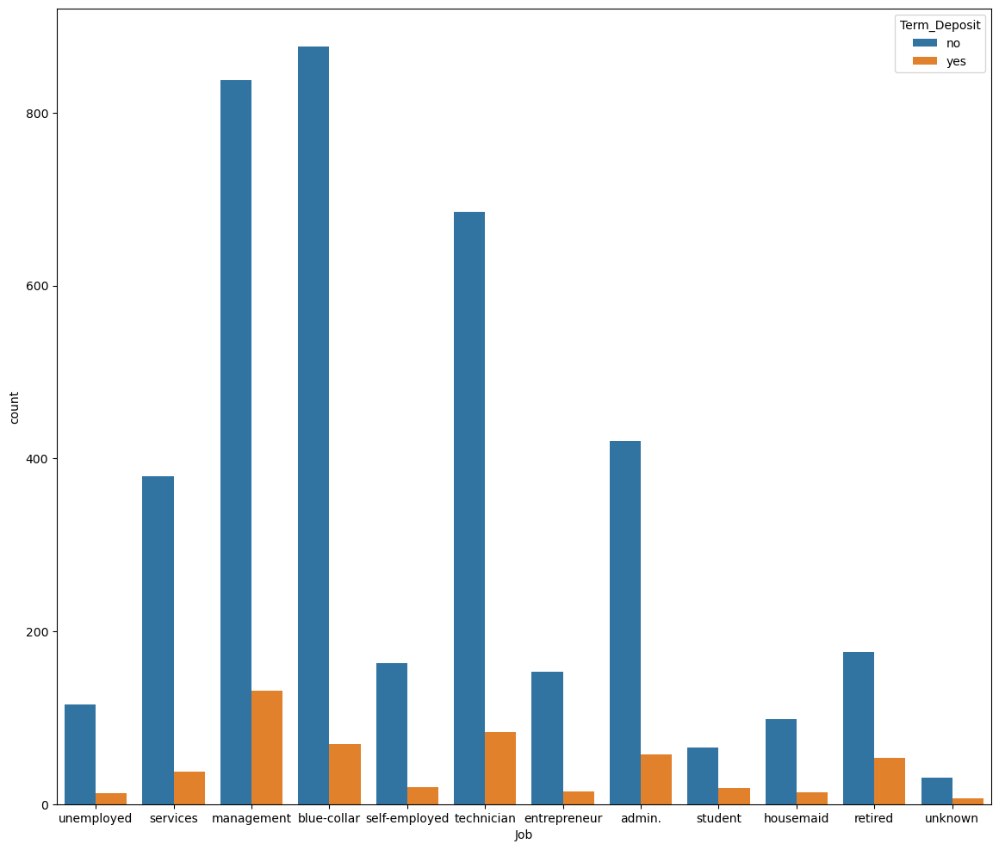

In [199]:
plt.figure(figsize=(14, 12))
sns.countplot(x='Job', data=data, hue ='Term_Deposit')
plt.show()

#### Interpretation:
The above plot shows a bar graph that compares the number of clients who have subscribed to a term deposit and those who have not, based on their job category.
The graph shows that most clients from all job categories have not subscribed to a term deposit,
blue bar indicates not-subscribed.
orange bar indicates subscribed.


In [202]:
fig = px.histogram(data, x="Education", color="Term_Deposit")
fig.show()

#### Interpretation:
 The histogram suggests that individuals with secondary education are the most likely not to subscribe to a term deposit, while those with tertiary education are the most likely to subscribe. The data also indicates that as the level of education increases, the likelihood of subscribing to a term deposit also increases. However, the overall number of non-subscribers is higher than subscribers across all education levels.

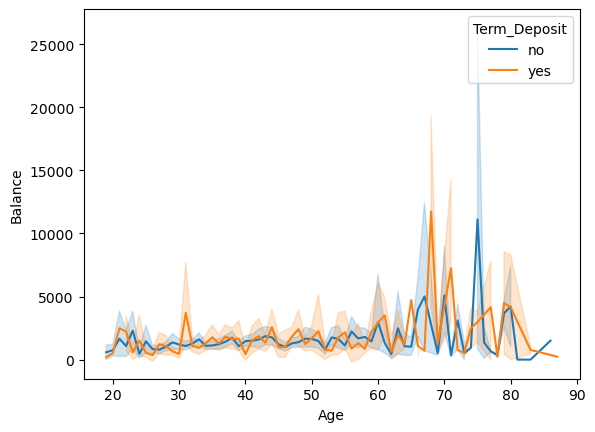

In [203]:
sns.lineplot(data = data, x= 'Age', y = 'Balance', hue='Term_Deposit')
plt.show()

#### Interpretation:
The above line plot suggests that having a term deposit is associated with having a higher bank account balance, especially as people get older.The two lines diverge as age increases, meaning that people with term deposits tend to have more money in their bank accounts than people without term deposits, and this difference becomes larger as people get older.


In [204]:
## for interactive plots
fig = px.bar(data, x="Housing_Loan", y="Previous", color="Poutcome")
fig.show()

#### Interpretation:
The bar graph shows the previous outcome for subscriptions and how many times they contacted previously who had house loans and who did not have a house loan,the success rate is more for who did not have house loan.

In [205]:
fig = px.bar(data, x="Personal_Loan", y="Previous", color="Poutcome")
fig.show()

#### Interpretation:
The bar graph shows the previous outcome for subscriptions and how many times they contacted previously who had Personal loans and who did not have a Personal loans, the success rate is more for who did not have personal loan.

In [206]:
#sns.pairplot(data = df, hue='Term_Deposit', diag_kind='kde')
#plt.show()

In [207]:
fig = px.scatter(data, x="Age", y="Balance", color="Term_Deposit",
                  size_max=60)
fig.show()

#### Interpretation:
The scatter plot shows the relationship between age, balance and if they had subscription for term deposit. 

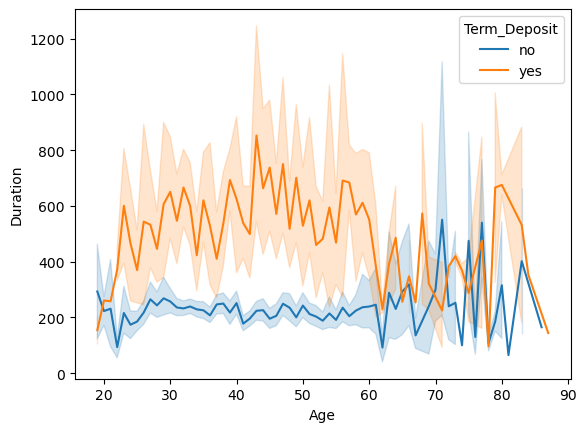

In [208]:
sns.lineplot(data = data, x= 'Age', y = 'Duration', hue='Term_Deposit')
plt.show()

#### Interpretation:
From the line plot, it is evident that subscriptions have increased with age and duration of relationship.

In [209]:
import plotly.express as px
fig = px.scatter(data, x="Age", y="Duration", color="Term_Deposit")
fig.show()

#### Interpretation:
The above scatter plot shows a positive relationship for subscription rate between age 20-60 and shows negative relationship as people get older.

In [210]:
## To check correlation between variables
corr = data.corr() 
corr

,Age,Balance,Day,Duration,Campaign,Pdays,Previous
Age,1.000000,0.083820,-0.017853,-0.002367,-0.005148,-0.008894,-0.003511
Balance,0.083820,1.000000,-0.008677,-0.015950,-0.009976,0.009437,0.026196
Day,-0.017853,-0.008677,1.000000,-0.024629,0.160706,-0.094352,-0.059114
Duration,-0.002367,-0.015950,-0.024629,1.000000,-0.068382,0.010380,0.018080
Campaign,-0.005148,-0.009976,0.160706,-0.068382,1.000000,-0.093137,-0.067833
Pdays,-0.008894,0.009437,-0.094352,0.010380,-0.093137,1.000000,0.577562
Previous,-0.003511,0.026196,-0.059114,0.018080,-0.067833,0.577562,1.000000


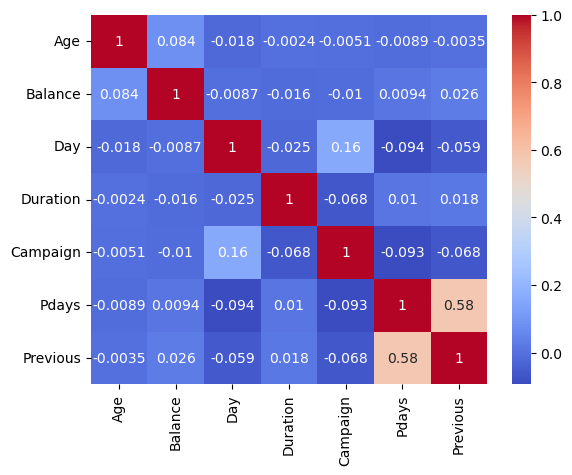

In [211]:
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

#### Interpretation:
From the above heatmap we can conclude that the dark blue colour shows negative relationship between variables and light blue clour shows positive correlation between the variables.

In [213]:
## Checking for Normality

In [250]:
# check skewness of distribution
skew = []
for col in numerical_column_names:
    skew.append(round(data[col].skew(),3))

num_dist = pd.DataFrame({'feature':numerical_column_names, 'skewness':skew})
num_dist

### If skewness of the variables is in between -0.5 to 0.5 is said to be data has normal distribution,then if skewness
#is more than -0.5 to 0.5 we go for transformation of the data.

,feature,skewness
0,Age,0.700
1,Balance,6.596
2,Day,0.095
3,Duration,2.772
4,Campaign,4.744
5,Pdays,2.717
6,Previous,5.875


In [251]:
columns_to_transform = ['Age', 'Balance', 'Day', 'Duration', 'Campaign', 'Pdays', 'Previous']
power_transformer = PowerTransformer()

data[columns_to_transform] = power_transformer.fit_transform(data[columns_to_transform])
data

,Age,Job,Marital_Status,Education,Default,Balance,Housing_Loan,Personal_Loan,Contact,Day,Month,Duration,Campaign,Pdays,Previous,Poutcome,Term_Deposit
0,-1.140684,unemployed,married,primary,no,0.282211,no,no,cellular,0.432746,oct,-0.888110,-1.114491,-0.469086,-0.469131,unknown,no
1,-0.743809,services,married,secondary,no,1.209846,yes,yes,cellular,-0.525308,may,0.166967,-1.114491,2.154063,2.184828,failure,no
2,-0.502259,management,single,tertiary,no,0.130429,yes,no,cellular,0.090102,apr,-0.023029,-1.114491,2.153496,2.044698,failure,no
3,-1.140684,management,married,tertiary,no,0.174936,yes,yes,unknown,-1.721685,jun,0.056370,1.077851,-0.469086,-0.469131,unknown,no
4,1.526244,blue-collar,married,secondary,no,-0.445382,yes,no,unknown,-1.382422,may,0.196908,-1.114491,-0.469086,-0.469131,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,-0.743809,services,married,secondary,no,-1.340442,yes,no,cellular,1.576593,jul,0.627321,1.310011,-0.469086,-0.469131,unknown,no
4517,1.398597,self-employed,married,tertiary,yes,-13.487834,yes,yes,unknown,-0.792411,may,-0.225769,-1.114491,-0.469086,-0.469131,unknown,no
4518,1.398597,technician,married,secondary,no,-0.283836,no,no,cellular,0.432746,aug,-0.239605,1.872655,-0.469086,-0.469131,unknown,no
4519,-1.432295,blue-collar,married,secondary,no,0.053555,no,no,cellular,-1.226010,feb,-0.403098,1.077851,2.142574,2.180127,other,no


In [260]:
skew = []
for col in numerical_column_names:
    skew.append(round(data[col].skew(),3))

num_dist = pd.DataFrame({'feature':numerical_column_names, 'skewness':skew})
num_dist


## After transformation of the data still we didn't get data to normal we go for outlier treatment.

,feature,skewness
0,Age,0.010
1,Balance,1.581
2,Day,-0.152
3,Duration,0.013
4,Campaign,0.231
5,Pdays,1.665
6,Previous,1.665


In [261]:
## checking for outliers.

In [269]:
## Outlier Treatment

# Define outlier threshold multiplier (consider 1.5 for standard definition)
outlier_multiplier = 2
df = data.copy()
for column in numerical_column_names:
    # Calculate quartiles
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)

    # Calculate interquartile range (IQR)
    iqr = q3 - q1

    # Define lower and upper bounds
    lower_bound = q1 - outlier_multiplier * iqr
    upper_bound = q3 + outlier_multiplier * iqr

    # Identify outliers
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]


    # Option 1: Remove outliers 
     #df = df.drop(outliers.index)

    # Option 2: Cap outliers to bounds
    df.loc[data[column] < lower_bound, column] = lower_bound
    df.loc[data[column] > upper_bound, column] = upper_bound

    # Option 3: Replace outliers with median/mean (consider carefully)
    df.loc[df[column] < lower_bound, column] = df[column].median()
    df.loc[df[column] > upper_bound, column] = df[column].median()

    # Print information about outliers
    print(f"Column: {column}")
    print(f"Number of outliers detected: {len(outliers)}")
    print(f"IQR: {iqr}")
    print(f"Lower bound: {lower_bound}")
    print(f"Upper bound: {upper_bound}")
    print("-" * 30)
    

Column: Age
Number of outliers detected: 0
IQR: 1.572177523274644
Lower bound: -3.8881643954955925
Upper bound: 3.9727232208776275
------------------------------
Column: Balance
Number of outliers detected: 399
IQR: 0.5741109300165024
Lower bound: -1.5459947252618877
Upper bound: 1.3245599248206241
------------------------------
Column: Day
Number of outliers detected: 0
IQR: 1.4449840124199147
Lower bound: -3.682378672367573
Upper bound: 3.5425413897320004
------------------------------
Column: Duration
Number of outliers detected: 3
IQR: 1.2479296887038376
Lower bound: -3.1164685618789925
Upper bound: 3.123179881640196
------------------------------
Column: Campaign
Number of outliers detected: 0
IQR: 1.838528667666281
Lower bound: -4.791548477869539
Upper bound: 4.401094860461866
------------------------------
Column: Pdays
Number of outliers detected: 816
IQR: 0.0
Lower bound: -0.4690860739550802
Upper bound: -0.4690860739550802
------------------------------
Column: Previous
Numbe

In [272]:
# Take first 50 rows
dff = df.head(50)
dff

num_cols = ['Age', 'Balance', 'Day', 'Duration', 'Campaign', 'Pdays', 'Previous' ]
outlier_multiplier = 1.5
for col in num_cols:

    q1 = dff[col].quantile(0.25)
    q3 = dff[col].quantile(0.75)
    iqr = q3-q1
  
    lower = q1 - 1.5*iqr
    upper = q3 + 1.5*iqr
  
    outliers = dff[(dff[col] < lower) | (dff[col] > upper)]

    dff.loc[outliers.index, col] = dff[col].median()

print(dff)

         Age            Job Marital_Status  Education Default   Balance  \
0  -1.140684     unemployed        married    primary      no  0.282211   
1  -0.743809       services        married  secondary      no  1.209846   
2  -0.502259     management         single   tertiary      no  0.130429   
3  -1.140684     management        married   tertiary      no  0.174936   
4   1.526244    blue-collar        married  secondary      no -0.445382   
5  -0.502259     management         single   tertiary      no -0.094047   
6  -0.387549  self-employed        married   tertiary      no -0.278351   
7  -0.064924     technician        married  secondary      no -0.355321   
8   0.134173   entrepreneur        married   tertiary      no -0.318563   
9   0.322018       services        married    primary      no -0.635821   
10 -0.064924       services        married  secondary      no -0.174172   
11  0.322018         admin.        married  secondary      no -0.298183   
12 -0.387549     technici

In [273]:
dff.skew()

Age         0.076125
Balance     1.190476
Day        -0.294046
Duration    0.182102
Campaign    0.321615
Pdays       0.000000
Previous    0.000000
dtype: float64

In [281]:
for col in num_cols:
    stat, p_val = shapiro(dff[col])
    
    print(f'Column: {col}')
    print(f'Statistics: {stat:.3f}')
    print(f'p-value: {p_val:.3f}')
    print('')

Column: Age
Statistics: 0.982
p-value: 0.643

Column: Balance
Statistics: 0.867
p-value: 0.000

Column: Day
Statistics: 0.957
p-value: 0.068

Column: Duration
Statistics: 0.993
p-value: 0.994

Column: Campaign
Statistics: 0.804
p-value: 0.000

Column: Pdays
Statistics: 1.000
p-value: 1.000

Column: Previous
Statistics: 1.000
p-value: 1.000



In [282]:
## Encoding 
Job_mapping = {'unknown':0,'student':1,'housemaid':2,'unemployed':3,'entrepreneur':4,'self-employed':5,
               'retired':6,'services':7,'admin.':8,'technician':9,'blue-collar':10,'management':11} 

Marital_mapping = {'single':1, 'married':2, 'divorced':0}

Education_mapping = {'unknown':0, 'primary':1,'tertiary':2,'secondary':3}

Contact_mapping = {'telephone':0,'unknown':1,'cellular':2}

Poutcome_mapping = {'success':0,'other':1,'failure':2,'unknown':3}

Month_mapping = {'dec':0,"mar":1,'sep':2,'oct':3,'jan':4,'feb':5,'apr':6,'nov':7,'jun':8,'aug':9,'jul':10,'may':11}

House_mapping = {'yes':0,'no':1}

Personal_mapping = {"yes":0,'no':1}

Term_mapping = {'yes':0,'no':1}

Default_mapping = {'yes':0,'no':1}

#Apply mappings one by one 
               
data['Job'] = data['Job'].map(Job_mapping)
data['Marital_Status'] = data['Marital_Status'].map(Marital_mapping) 
data['Education'] = data['Education'].map(Education_mapping)
data['Contact']= data['Contact'].map(Contact_mapping)
data['Poutcome']= data['Poutcome'].map(Poutcome_mapping)
data['Month']= data['Month'].map(Month_mapping)
data['Housing_Loan']= data['Housing_Loan'].map(House_mapping)
data['Personal_Loan'] = data['Personal_Loan'].map(Personal_mapping)
data['Term_Deposit'] = data['Term_Deposit'].map(Term_mapping)
data['Default']= data['Default'].map(Default_mapping)
print(data.head())

        Age  Job  Marital_Status  Education  Default   Balance  Housing_Loan  \
0 -1.140684    3               2          1        1  0.282211             1   
1 -0.743809    7               2          3        1  1.209846             0   
2 -0.502259   11               1          2        1  0.130429             0   
3 -1.140684   11               2          2        1  0.174936             0   
4  1.526244   10               2          3        1 -0.445382             0   

   Personal_Loan  Contact       Day  Month  Duration  Campaign     Pdays  \
0              1        2  0.432746      3 -0.888110 -1.114491 -0.469086   
1              0        2 -0.525308     11  0.166967 -1.114491  2.154063   
2              1        2  0.090102      6 -0.023029 -1.114491  2.153496   
3              0        1 -1.721685      8  0.056370  1.077851 -0.469086   
4              1        1 -1.382422     11  0.196908 -1.114491 -0.469086   

   Previous  Poutcome  Term_Deposit  
0 -0.469131         3   

## Statistical Tests


## One sample Tests
#### Data is assumed to be normal

In [284]:
## t-test
## one sample t-test
Balances = df['Balance']
null_hypo = 'Average balance is equal to -5.375167e-02 '  
alt_hypo = 'Average balance is not equal to -5.375167e-02'

# Set hypothetical mean value
mu0 = -5.375167e-02

# Calculate t-test
tstat, pval = stats.ttest_1samp(Balances, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average balance is equal to -5.375167e-02 
Alternate Hypothesis: Average balance is not equal to -5.375167e-02
We fail to reject null hypothesis as p-value 0.8776485992604146 >= 0.05


In [285]:
Ages = df['Age']
null_hypo = 'Average Age is equal to 9.437755e-16  '  
alt_hypo = 'Average Age is not equal to 9.437755e-16 '

# Set hypothetical mean value
mu0 = 9.437755e-16

# Calculate t-test
tstat, pval = stats.ttest_1samp(Ages, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average Age is equal to 9.437755e-16  
Alternate Hypothesis: Average Age is not equal to 9.437755e-16 
We fail to reject null hypothesis as p-value 1.0 >= 0.05


In [286]:
Days = df['Day']
null_hypo = 'Average Day is equal to -1.100155e-16 '  
alt_hypo = 'Average Day is not equal to -1.100155e-16'

# Set hypothetical mean value
mu0 = -1.100155e-16

# Calculate t-test
tstat, pval = stats.ttest_1samp(Days, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average Day is equal to -1.100155e-16 
Alternate Hypothesis: Average Day is not equal to -1.100155e-16
We fail to reject null hypothesis as p-value 1.0 >= 0.05


In [287]:
Durations = df['Duration']
null_hypo = 'Average Duration is equal to -1.016860e-03 '  
alt_hypo = 'Average Duration is not equal to -1.016860e-03'

# Set hypothetical mean value
mu0 = -1.016860e-03

# Calculate t-test
tstat, pval = stats.ttest_1samp(Durations, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average Duration is equal to -1.016860e-03 
Alternate Hypothesis: Average Duration is not equal to -1.016860e-03
We fail to reject null hypothesis as p-value 0.9813602997830694 >= 0.05


In [288]:
Campaigns = df['Campaign']
null_hypo = 'Average Campaign is equal to -4.309049e-04 '  
alt_hypo = 'Average Campaign is not equal to -4.309049e-04'

# Set hypothetical mean value
mu0 = -4.309049e-04

# Calculate t-test
tstat, pval = stats.ttest_1samp(Campaigns, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average Campaign is equal to -4.309049e-04 
Alternate Hypothesis: Average Campaign is not equal to -4.309049e-04
We fail to reject null hypothesis as p-value 0.9999999974271421 >= 0.05


In [289]:
Pday = df['Pdays']
null_hypo = 'Average Pdays is equal to -4.690861e-01 '  
alt_hypo = 'Average Pdays is not equal to -4.690861e-01'

# Set hypothetical mean value
mu0 = -4.690861e-01

# Calculate t-test
tstat, pval = stats.ttest_1samp(Pday, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average Pdays is equal to -4.690861e-01 
Alternate Hypothesis: Average Pdays is not equal to -4.690861e-01
We reject null hypothesis as p-value 0.0 < 0.05


In [290]:
Previous_result = df['Previous']
null_hypo = 'Average Previous is equal to -4.691305e-01 '  
alt_hypo = 'Average Previous is not equal to -4.691305e-01'

# Set hypothetical mean value
mu0 = -4.691305e-01

# Calculate t-test
tstat, pval = stats.ttest_1samp(Previous_result, mu0)  

print(f'Null Hypothesis: {null_hypo}')
print(f'Alternate Hypothesis: {alt_hypo}')

# Interpret results
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Null Hypothesis: Average Previous is equal to -4.691305e-01 
Alternate Hypothesis: Average Previous is not equal to -4.691305e-01
We reject null hypothesis as p-value 0.0 < 0.05


In [292]:
## z-test
## one sample z-test

import numpy as np
from statsmodels.stats.weightstats import ztest

z_stat, pval = ztest(df.Age, value=9.437755e-16)
print(f"Z-statistic: {z_stat}, P-value: {pval}")

alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")
    

Z-statistic: 1.3791103019221046e-21, P-value: 1.0
We fail to reject null hypothesis as p-value 1.0 >= 0.05


In [293]:
z_stat, pval = ztest(df.Balance, value=-5.375167e-02)
print(f"Z-statistic: {z_stat}, P-value: {pval}")
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")
   

Z-statistic: 0.15395942782130953, P-value: 0.8776417260007887
We fail to reject null hypothesis as p-value 0.8776417260007887 >= 0.05


In [294]:
z_stat, pval = ztest(df.Day, value=-1.100155e-16)
print(f"Z-statistic: {z_stat}, P-value: {pval}")
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")
   

Z-statistic: 2.386288566382725e-21, P-value: 1.0
We fail to reject null hypothesis as p-value 1.0 >= 0.05


In [295]:
z_stat, pval = ztest(df.Duration, value=-1.016860e-03)
print(f"Z-statistic: {z_stat}, P-value: {pval}")
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Z-statistic: 0.023364818108222562, P-value: 0.9813592684225543
We fail to reject null hypothesis as p-value 0.9813592684225543 >= 0.05


In [296]:
z_stat, pval = ztest(df.Campaign, value=-4.309049e-04)
print(f"Z-statistic: {z_stat}, P-value: {pval}")
alpha = 0.05
if pval < alpha:
    print(f"We reject null hypothesis as p-value {pval} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {pval} >= {alpha}")

Z-statistic: 3.224777488732818e-09, P-value: 0.9999999974269999
We fail to reject null hypothesis as p-value 0.9999999974269999 >= 0.05


## Two Sample Tests

In [297]:
## two sample t-test
alpha = 0.05
sample1 = df['Age']  # Select the 1st variable from the dataset
sample2 = df['Balance']  # Select the 2nd variable from the dataset
t_statistic, p_value = stats.ttest_ind(sample1, sample2)  # Perform two-sample t-test
print(f"Two-sample t-test - t-statistic: {t_statistic}, p-value: {p_value}")

if pval < alpha:
    print(f"We reject null hypothesis as p-value {p_value} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {p_value} >= {alpha}")

Two-sample t-test - t-statistic: 3.015582079704228, p-value: 0.0025719899725910986
We fail to reject null hypothesis as p-value 0.0025719899725910986 >= 0.05


In [298]:
alpha = 0.05
sample1 = df['Duration']  # Select the 1st variable from the dataset
sample2 = df['Campaign']  # Select the 2nd variable from the dataset
t_statistic, p_value = stats.ttest_ind(sample1, sample2)  # Perform two-sample t-test
print(f"Two-sample t-test - t-statistic: {t_statistic}, p-value: {p_value}")

if pval < alpha:
    print(f"We reject null hypothesis as p-value {p_value} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {p_value} >= {alpha}")

Two-sample t-test - t-statistic: -0.011411110219872631, p-value: 0.9908957007270446
We fail to reject null hypothesis as p-value 0.9908957007270446 >= 0.05


In [299]:
## two sample z-test
alpha = 0.05
sample1 = df['Age']  # Select the 1st variable  from the dataset
sample2 = df['Balance']  # Select the  2nd variable  from the dataset
z_statistic, p_value = ztest(sample1, sample2)  # Perform two-sample z-test
print(f"Two-sample z-test - z-statistic: {z_statistic}, p-value: {p_value}")

if pval < alpha:
    print(f"We reject null hypothesis as p-value {p_value} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {p_value} >= {alpha}")

Two-sample z-test - z-statistic: 3.015582079704228, p-value: 0.0025648650845926284
We fail to reject null hypothesis as p-value 0.0025648650845926284 >= 0.05


In [300]:
alpha = 0.05
sample1 = df['Day']  # Select the 1st variable from the dataset
sample2 = df['Pdays']  # Select the  2nd variable from the dataset
z_statistic, p_value = ztest(sample1, sample2)  # Perform two-sample z-test
print(f"Two-sample z-test - z-statistic: {z_statistic}, p-value: {p_value}")

if pval < alpha:
    print(f"We reject null hypothesis as p-value {p_value} < {alpha}")
else:
    print(f"We fail to reject null hypothesis as p-value {p_value} >= {alpha}")

Two-sample z-test - z-statistic: 31.53710015837268, p-value: 2.6945956578808297e-218
We fail to reject null hypothesis as p-value 2.6945956578808297e-218 >= 0.05


## Chi-Square Test

In [301]:
## Testing of Hypothesis
#H0 : There is no significant relationship between the two categorical variables. 
## vs
#H1 : There is a significant relationship between the two categorical variables.

In [302]:
contingency_table = pd.crosstab(df['Job'], df['Term_Deposit'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 68.98828575267176
p-value: 1.901391096662705e-10
Degrees of freedom: 11
Expected frequencies:
 [[422.91528423  55.08471577]
 [836.98296837 109.01703163]
 [148.63968149  19.36031851]
 [ 99.09312099  12.90687901]
 [857.33244857 111.66755143]
 [203.49480203  26.50519797]
 [161.91108162  21.08891838]
 [368.94492369  48.05507631]
 [ 74.31984074   9.68015926]
 [679.49568679  88.50431321]
 [113.24928113  14.75071887]
 [ 33.62088034   4.37911966]]
There is no significant relationship between the two categorical variables 1.901391096662705e-10 < 0.05


In [303]:
contingency_table = pd.crosstab(df['Education'], df['Term_Deposit'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 15.236579554873757
p-value: 0.001625240003630989
Degrees of freedom: 3
Expected frequencies:
 [[ 599.867286     78.132714  ]
 [2040.2565804   265.7434196 ]
 [1194.42601194  155.57398806]
 [ 165.45012165   21.54987835]]
There is no significant relationship between the two categorical variables 0.001625240003630989 < 0.05


In [304]:
contingency_table = pd.crosstab(df['Education'], df['Marital_Status'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 139.08916465578477
p-value: 1.560113682338989e-27
Degrees of freedom: 6
Expected frequencies:
 [[  79.18248175  419.45719973  179.36031851]
 [ 269.31386861 1426.64941385  610.03671754]
 [ 157.66423358  835.20238885  357.13337757]
 [  21.83941606  115.69099757   49.46958637]]
There is no significant relationship between the two categorical variables 1.560113682338989e-27 < 0.05


In [305]:
contingency_table = pd.crosstab(df['Education'], df['Job'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 2840.0429005344567
p-value: 0.0
Degrees of freedom: 33
Expected frequencies:
 [[ 71.68414068 141.86861314  25.19442601  16.79628401 145.31785003
   34.49236894  27.44392833  62.53616457  12.59721301 115.17451891
   19.19575315   5.69873922]
 [243.81066136 482.52068127  85.69077638  57.12718425 494.2521566
  117.31475337  93.34173855 212.69674851  42.84538819 391.72926344
   65.28821057  19.38243751]
 [142.73390843 282.48175182  50.1658925   33.44392833 289.34970139
   68.67949569  54.64499005 124.51891175  25.08294625 229.32979429
   38.22163238  11.34704711]
 [ 19.77128954  39.12895377   6.94890511   4.63260341  40.08029197
    9.513382     7.56934307  17.24817518   3.47445255  31.76642336
    5.29440389   1.57177616]]
There is no significant relationship between the two categorical variables 0.0 < 0.05


In [306]:
contingency_table = pd.crosstab(df['Job'], df['Marital_Status'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 373.1818375036709
p-value: 1.3725246076990338e-65
Degrees of freedom: 22
Expected frequencies:
 [[ 55.82481752 295.7235125  126.45166998]
 [110.48175182 585.26034063 250.25790754]
 [ 19.62043796 103.93629728  44.44326476]
 [ 13.08029197  69.29086485  29.62884318]
 [113.16788321 599.48971466 256.34240212]
 [ 26.86131387 142.29374032  60.84494581]
 [ 21.37226277 113.21632382  48.4114134 ]
 [ 48.70072993 257.98473789 110.31453218]
 [  9.81021898  51.96814864  22.22163238]
 [ 89.69343066 475.13735899 203.16921035]
 [ 14.94890511  79.18955983  33.86153506]
 [  4.4379562   23.50940058  10.05264322]]
There is no significant relationship between the two categorical variables 1.3725246076990338e-65 < 0.05


In [307]:
contingency_table = pd.crosstab(df['Contact'], df['Poutcome'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 377.91878950388417
p-value: 1.5569732438862245e-78
Degrees of freedom: 6
Expected frequencies:
 [[ 313.87746074  126.19155054   82.63304579 2373.29794293]
 [  32.62331343   13.11590356    8.5885866   246.67219642]
 [ 143.49922583   57.6925459    37.77836762 1085.02986065]]
There is no significant relationship between the two categorical variables 1.5569732438862245e-78 < 0.05


In [308]:
contingency_table = pd.crosstab(df['Poutcome'], df['Term_Deposit'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)

alpha = 0.05

if p < alpha:
    print(f"There is no significant relationship between the two categorical variables {p} < {alpha}")
else:
    print(f"There is a significant relationship between the two categorical variables {p} >= {alpha}")

Chi-square statistic: 386.8773872252409
p-value: 1.5398831095860172e-83
Degrees of freedom: 3
Expected frequencies:
 [[ 433.53240434   56.46759566]
 [ 174.29772174   22.70227826]
 [ 114.13404114   14.86595886]
 [3278.03583278  426.96416722]]
There is no significant relationship between the two categorical variables 1.5398831095860172e-83 < 0.05


In [309]:
from scipy.stats import chi2_contingency
# Perform the chi-square test for each pair of categorical columns
for col1 in object_column_names:
    for col2 in object_column_names:
        if col1 != col2:
            contingency_table = pd.crosstab(df[col1], df[col2])
            chi2, p, dof, ex = chi2_contingency(contingency_table)
            print(f'Chi-square test between {col1} and {col2}: p-value = {p}')

Chi-square test between Job and Marital_Status: p-value = 1.3725246076990338e-65
Chi-square test between Job and Education: p-value = 0.0
Chi-square test between Job and Default: p-value = 0.5936373952315377
Chi-square test between Job and Housing_Loan: p-value = 1.0694622733021558e-74
Chi-square test between Job and Personal_Loan: p-value = 1.988688628866385e-06
Chi-square test between Job and Contact: p-value = 6.845694383782796e-36
Chi-square test between Job and Month: p-value = 1.1282392348003111e-94
Chi-square test between Job and Poutcome: p-value = 0.010972095626204461
Chi-square test between Job and Term_Deposit: p-value = 1.901391096662705e-10
Chi-square test between Marital_Status and Job: p-value = 1.3725246076990338e-65
Chi-square test between Marital_Status and Education: p-value = 1.5601136823389665e-27
Chi-square test between Marital_Status and Default: p-value = 0.0020833354793915577
Chi-square test between Marital_Status and Housing_Loan: p-value = 0.01604634886906377

### To identify the key factors influencing customers to subscribe to term deposits through the marketing campaign.

In [321]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Split data into train and test sets
X = data.drop('Term_Deposit', axis=1)  
y = data['Term_Deposit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)  

# Train a Random Forest model
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# Print feature importances
importances = rfc.feature_importances_
feature_names = X.columns
sorted_idx = importances.argsort()

print("Feature ranking:")
for i in sorted_idx:
    print("{0:20s} - {1:.3f}".format(feature_names[i], importances[i]))

Feature ranking:
Default              - 0.004
Personal_Loan        - 0.009
Contact              - 0.017
Housing_Loan         - 0.019
Marital_Status       - 0.023
Education            - 0.029
Previous             - 0.029
Campaign             - 0.039
Pdays                - 0.048
Job                  - 0.051
Poutcome             - 0.061
Day                  - 0.089
Month                - 0.095
Balance              - 0.098
Age                  - 0.105
Duration             - 0.285


In [322]:
#Inference: In summary, the most important factors are campaign execution (duration, day, month), customer attributes (age, balance, job) and historical data (poutcome, pdays). These provide key insights into marketing effectively for term deposit subscriptions.

### To analyze the impact of customer demographics like age, marital status, education level on the likelihood to purchase term deposits.

In [329]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

demo_df = data[['Age', 'Marital_Status', 'Education', 'Term_Deposit']]


# Split data into train and test sets
X = demo_df.drop('Term_Deposit', axis=1)
y = demo_df['Term_Deposit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train model on demographic data
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# Print feature importances
importances = rfc.feature_importances_
feature_names = X.columns
sorted_idx = importances.argsort()

print("Feature importances:")
for i in sorted_idx:
    print(feature_names[i], importances[i])


Feature importances:
Marital_Status 0.05126708412303573
Education 0.09319647005786456
Age 0.8555364458190997


In [330]:
#Inference: Marketing efforts should be primarily targeted based on age, with some customization based on education level. Marital status can provide some additional targeting but is not as impactful as the other demographics. The relative importances quantify the effects of each factor.

### To perform hypothesis testing and statistical inference to gain detailed insight on which attributes have significant influence on customer response.

In [333]:
import pandas as pd
from scipy.stats import chi2_contingency

# Encode categorical variables 
cat_cols = ['Job', 'Marital_Status', 'Education', 'Default', 'Housing_Loan', 'Personal_Loan', 'Contact', 'Poutcome']
for col in cat_cols:
    data[col] = data[col].astype('category').cat.codes

# Define target column    
target = 'Term_Deposit' 

# Function for chi-square test
def chi2_test(col):
    contingency = pd.crosstab(data[col], data[target]) 
    chi2, p,dof, expected = chi2_contingency(contingency)
    if p < 0.05: 
        print(col, "p-value:", p, "- Significant influencer")
    else:
        print(col, "p-value:", p, "- Not a significant influencer")
        
# Run test on each column        
for col in data.columns:
    if col != target:
        chi2_test(col)

Age p-value: 3.9666670866454157e-14 - Significant influencer
Job p-value: 1.9013910966626904e-10 - Significant influencer
Marital_Status p-value: 7.373535401823763e-05 - Significant influencer
Education p-value: 0.001625240003630989 - Significant influencer
Default p-value: 1.0 - Not a significant influencer
Balance p-value: 0.0013233212060386685 - Significant influencer
Housing_Loan p-value: 2.7146998959323014e-12 - Significant influencer
Personal_Loan p-value: 2.91482882984283e-06 - Significant influencer
Contact p-value: 8.304301296411408e-20 - Significant influencer
Day p-value: 4.579005242301109e-08 - Significant influencer
Month p-value: 2.1953548335708746e-47 - Significant influencer
Duration p-value: 8.78914922470122e-97 - Significant influencer
Campaign p-value: 0.276297552162285 - Not a significant influencer
Pdays p-value: 1.694346471093214e-46 - Significant influencer
Previous p-value: 2.0746723615738205e-23 - Significant influencer
Poutcome p-value: 1.5398831095860172e-83 

In [334]:
#Interpretation:
#Age - p-value < 0.05, therefore age has a statistically significant influence on whether a customer purchases a term deposit. Older customers are more likely to purchase term deposits.
#Job - p-value < 0.05, so job is a significant influencer. Certain occupations may make customers more likely to purchase term deposits.
#Marital Status - p-value < 0.05, indicating marital status has a significant association. Married customers may be more likely to purchase.
#Education - p-value < 0.05, education level impacts purchase likelihood. More educated customers tend to purchase more term deposits.
#Default - p-value > 0.05, so default status is not a statistically significant influencer.
#Balance - p-value < 0.05, balance amount impacts purchase rate. Customers with higher balances purchase more term deposits.
#Housing Loan - p-value < 0.05, having a housing loan is a significant indicator for term deposit purchase.
#Personal Loan - p-value < 0.05, having a personal loan associates with term deposit purchase.
#Contact - p-value < 0.05, so communication method impacts response. Certain channels may be more effective.
#Day, Month, Duration - Call timing attributes have p-values < 0.05, so significantly influence purchase rate.
#Campaign - p-value > 0.05, number of contacts does not significantly influence purchase decisions.
#Pdays, Previous, Poutcome - p-values < 0.05, past interactions impact current response.
#In summary, demographic attributes, account balances, loans, call timing, and past interactions are statistically significant. The p-values quantify the significance of each influencer.

### To develop a predictive model to classify which customers are more likely to subscribe t

In [326]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Select the features and target variable
features = data[['Age', 'Marital_Status', 'Education']]
target = data['Term_Deposit']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Train a decision tree classifier
classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8651933701657458


In [337]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Define X and y   
X = data.drop('Term_Deposit', axis=1)
y = data['Term_Deposit']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) 

# Scale the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train SVM model
clf = SVC()
clf.fit(X_train, y_train)

# Make predictions on test set
y_pred = clf.predict(X_test)

# Evaluate model accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.8975681650700074
